<a href="https://colab.research.google.com/github/simon-hpl/mask2former/blob/main/M2F_Inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.7/536.7 kB 6.2 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
#model_version = r'/content/drive/My Drive/AI Models/MaskFormer/26March_10'
model_version = r'/content/drive/My Drive/AI Models/Mask2Former_Can_RAT_2Feb2026/phase_6'


In [6]:
import torch
from transformers import Mask2FormerForUniversalSegmentation, AutoImageProcessor
processor = AutoImageProcessor.from_pretrained(model_version)

model = Mask2FormerForUniversalSegmentation.from_pretrained(
   model_version, ignore_mismatched_sizes=True
)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device)




Loading weights:   0%|          | 0/782 [00:00<?, ?it/s]

Mask2FormerForUniversalSegmentation(
  (model): Mask2FormerModel(
    (pixel_level_module): Mask2FormerPixelLevelModule(
      (encoder): SwinBackbone(
        (embeddings): SwinEmbeddings(
          (patch_embeddings): SwinPatchEmbeddings(
            (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
          )
          (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
        )
        (encoder): SwinEncoder(
          (layers): ModuleList(
            (0): SwinStage(
              (blocks): ModuleList(
                (0): SwinLayer(
                  (layernorm_before): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
                  (attention): SwinAttention(
                    (self): SwinSelfAttention(
                      (query): Linear(in_features=128, out_features=128, bias=True)
                      (key): Linear(in_features=128, out_features=128, bias=True)
                      (valu

In [7]:
def get_prediction(image):
  inputs = processor(images=[image], return_tensors="pt")
  inputs = inputs.to(device)
  with torch.no_grad():
    outputs = model(**inputs)
  predicted_semantic_map = processor.post_process_panoptic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]
  return predicted_semantic_map

`label_ids_to_fuse` unset. No instance will be fused.


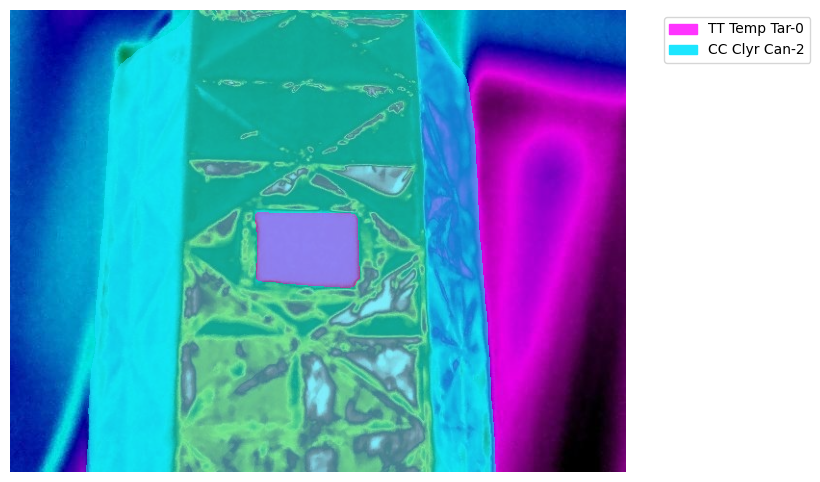

`label_ids_to_fuse` unset. No instance will be fused.


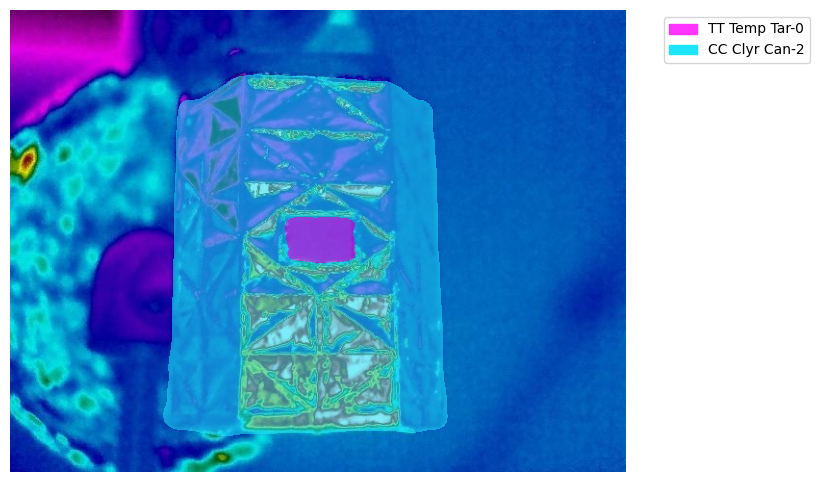

`label_ids_to_fuse` unset. No instance will be fused.


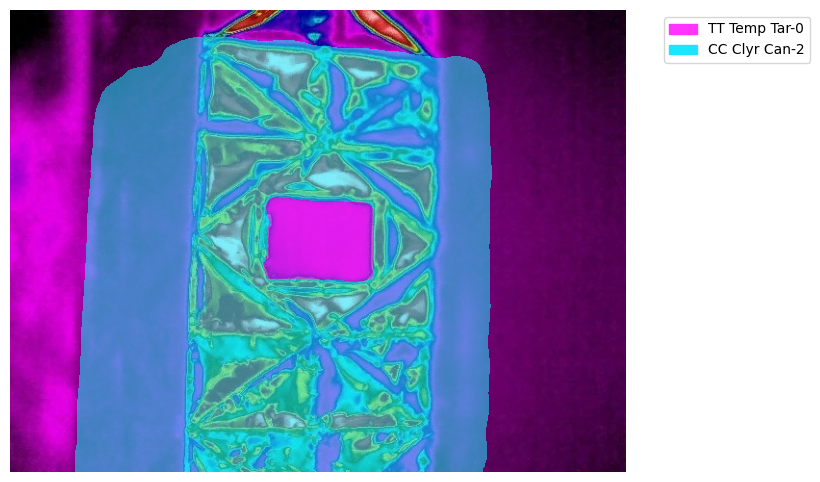

`label_ids_to_fuse` unset. No instance will be fused.


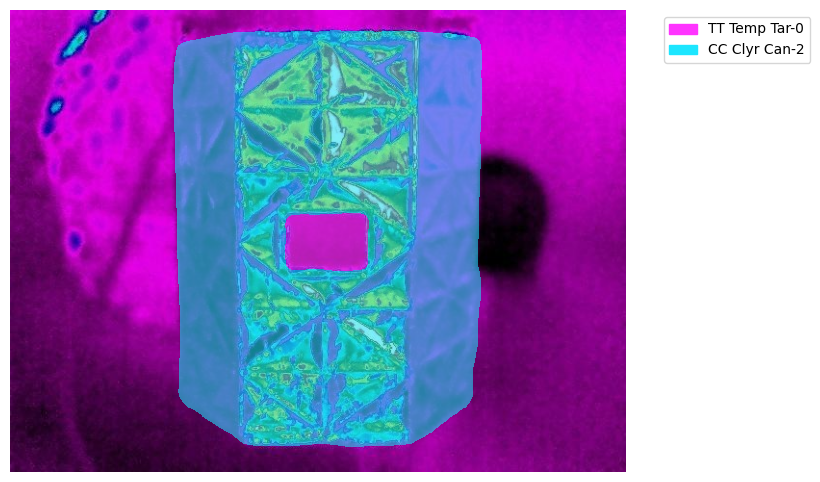

`label_ids_to_fuse` unset. No instance will be fused.


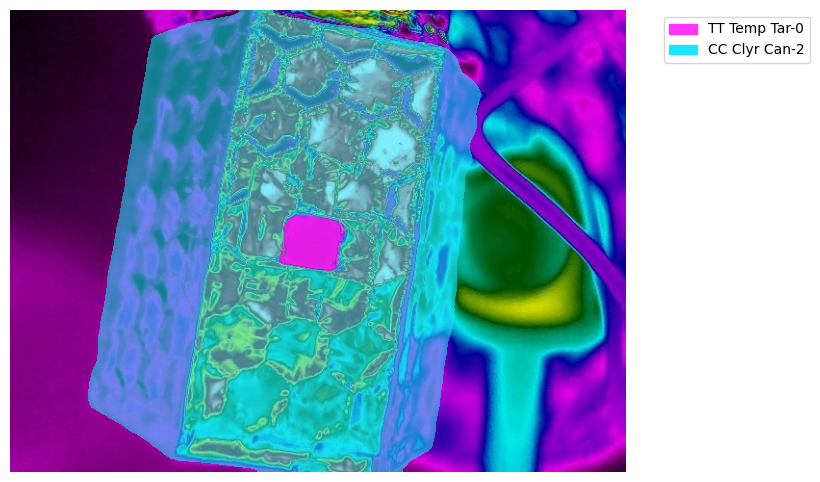

`label_ids_to_fuse` unset. No instance will be fused.


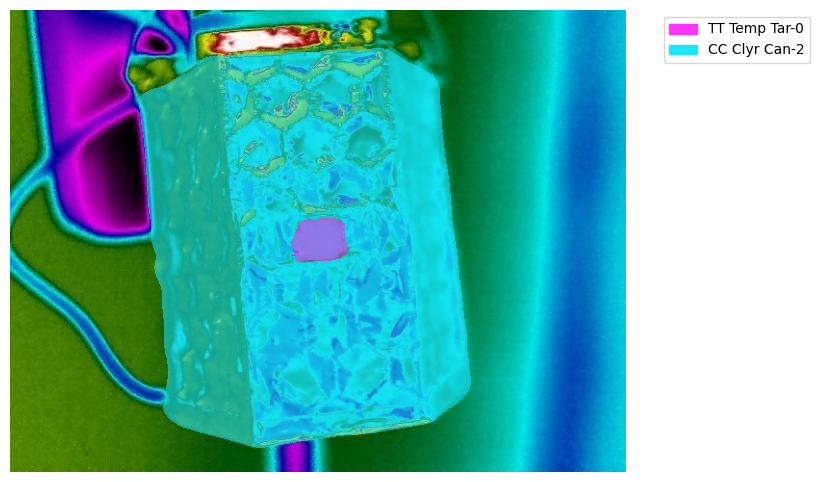

`label_ids_to_fuse` unset. No instance will be fused.


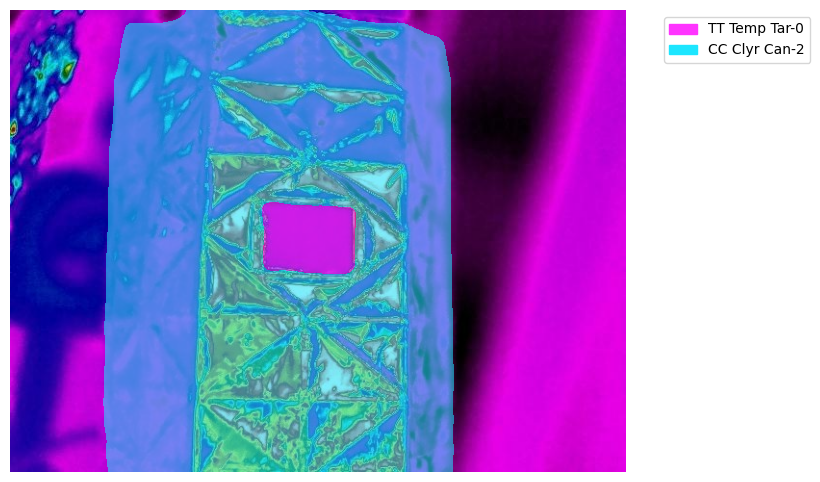

`label_ids_to_fuse` unset. No instance will be fused.


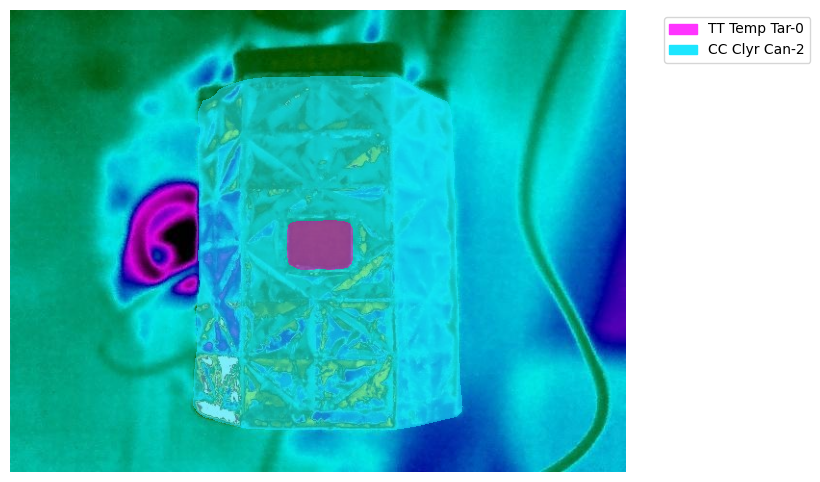

`label_ids_to_fuse` unset. No instance will be fused.


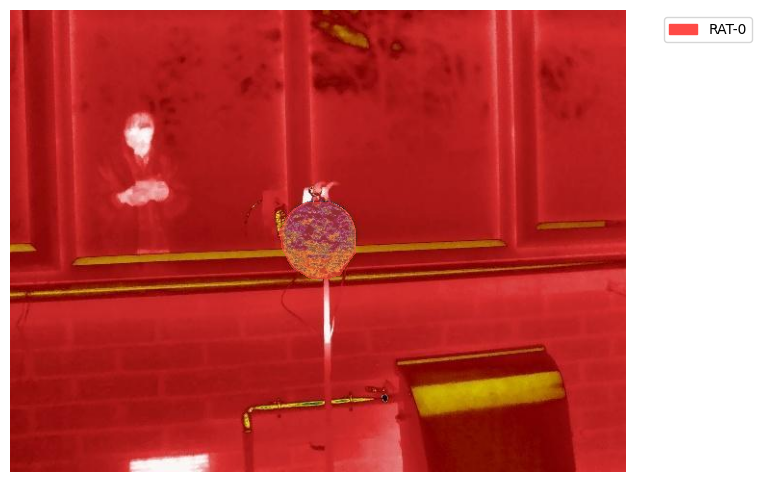

`label_ids_to_fuse` unset. No instance will be fused.


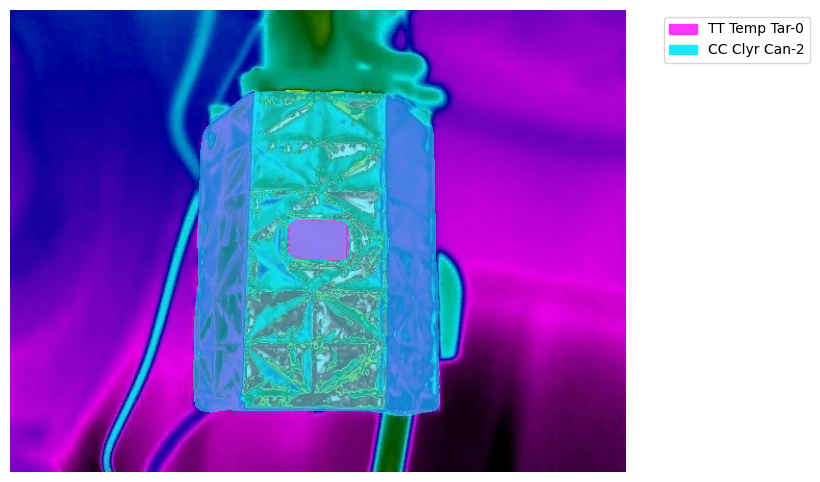

`label_ids_to_fuse` unset. No instance will be fused.


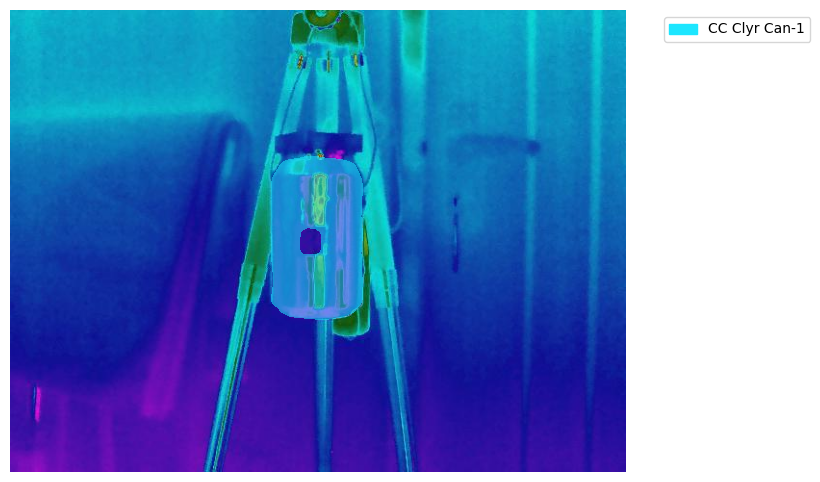

`label_ids_to_fuse` unset. No instance will be fused.


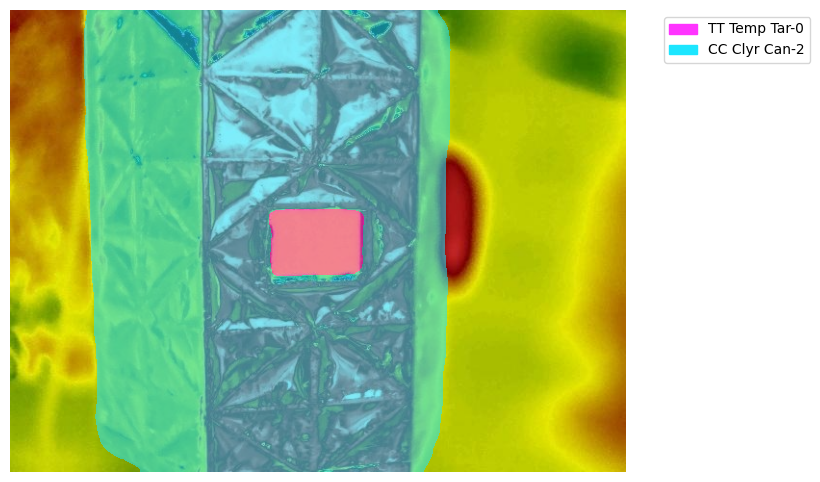

`label_ids_to_fuse` unset. No instance will be fused.


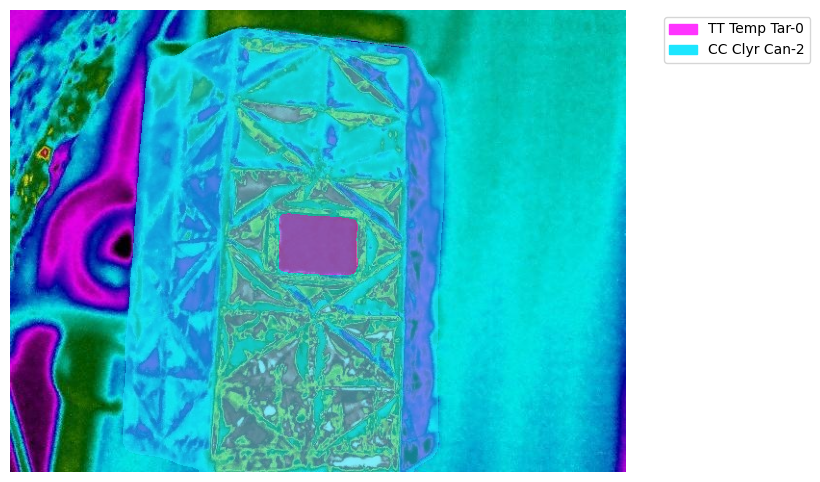

`label_ids_to_fuse` unset. No instance will be fused.


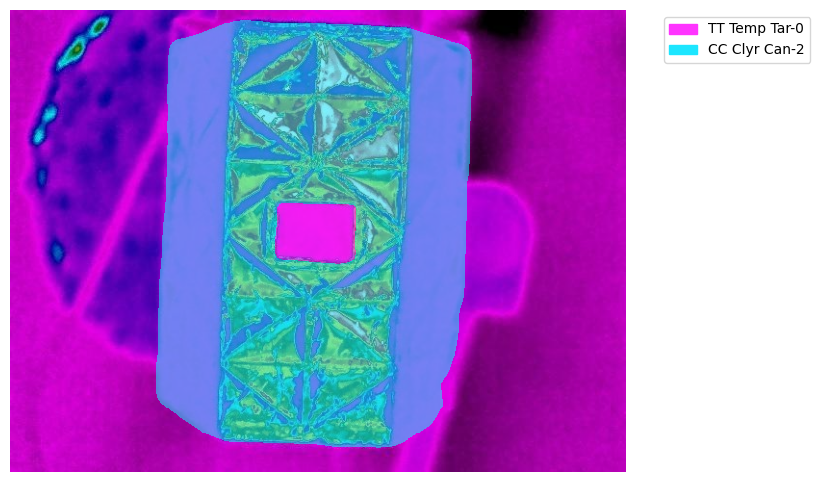

`label_ids_to_fuse` unset. No instance will be fused.


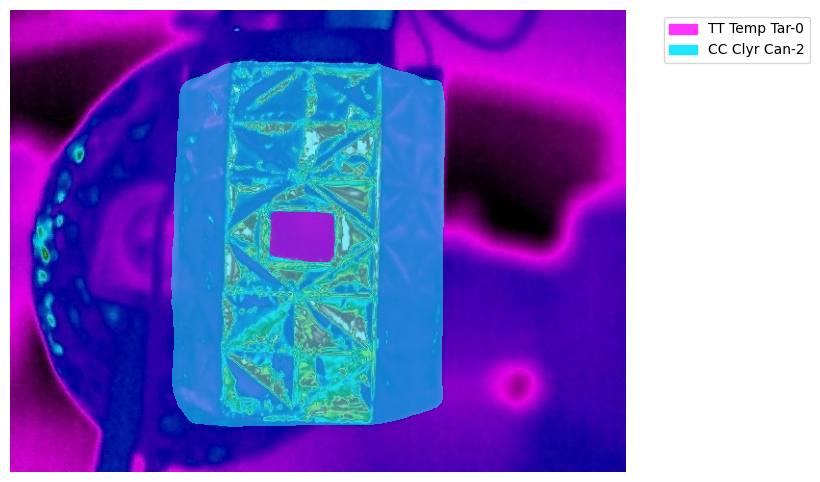

`label_ids_to_fuse` unset. No instance will be fused.


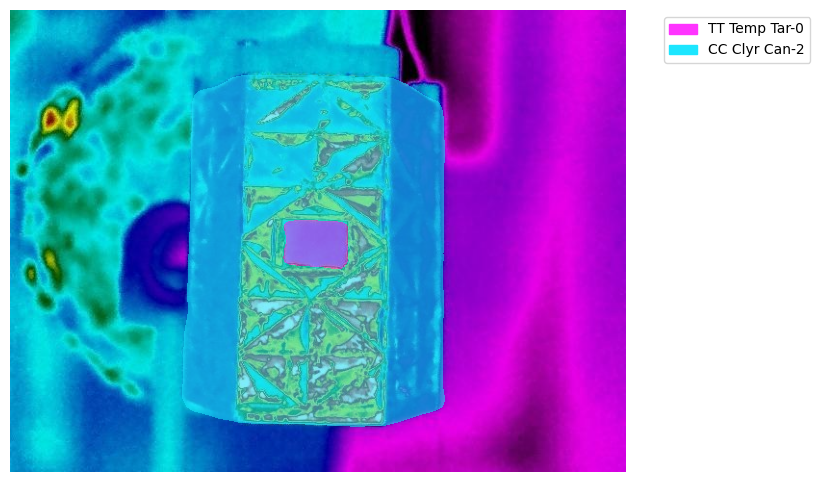

`label_ids_to_fuse` unset. No instance will be fused.


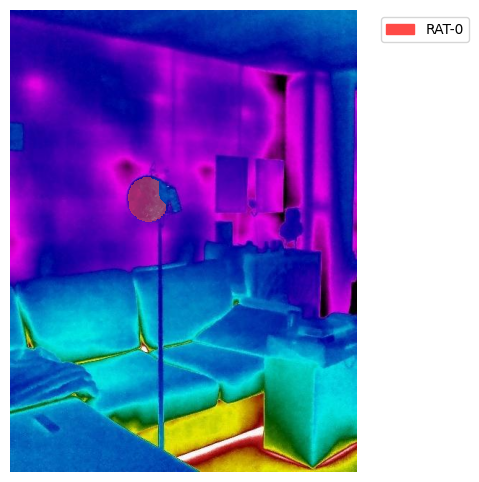

`label_ids_to_fuse` unset. No instance will be fused.


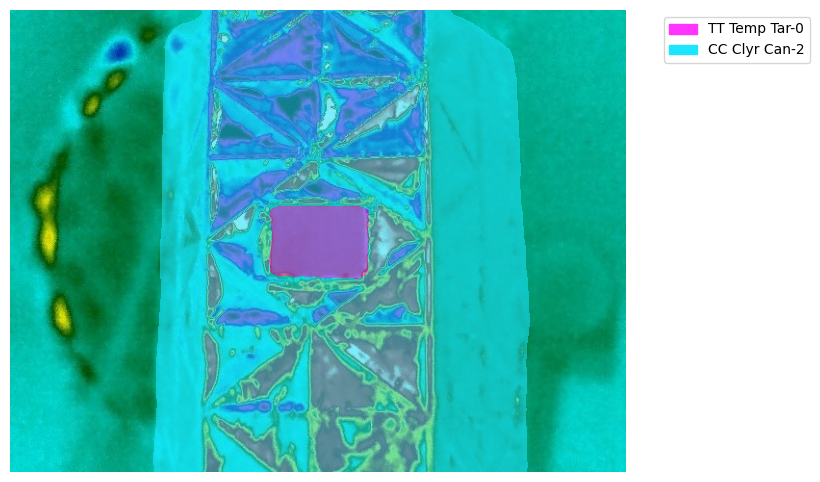

`label_ids_to_fuse` unset. No instance will be fused.


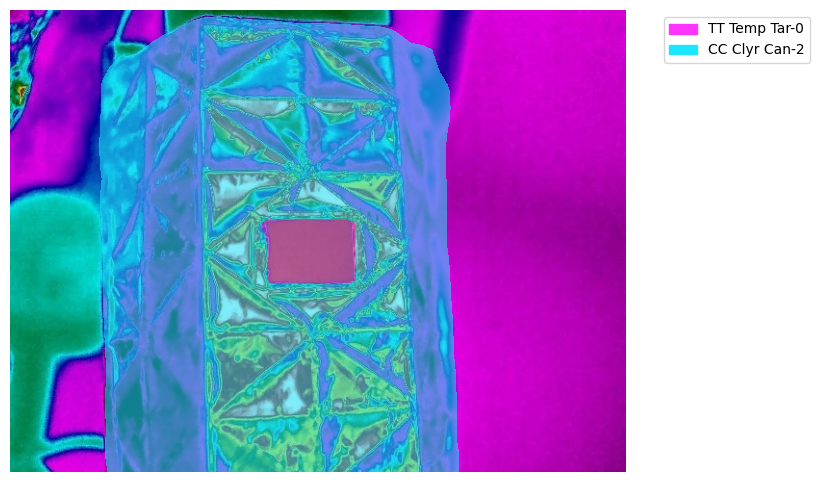

`label_ids_to_fuse` unset. No instance will be fused.


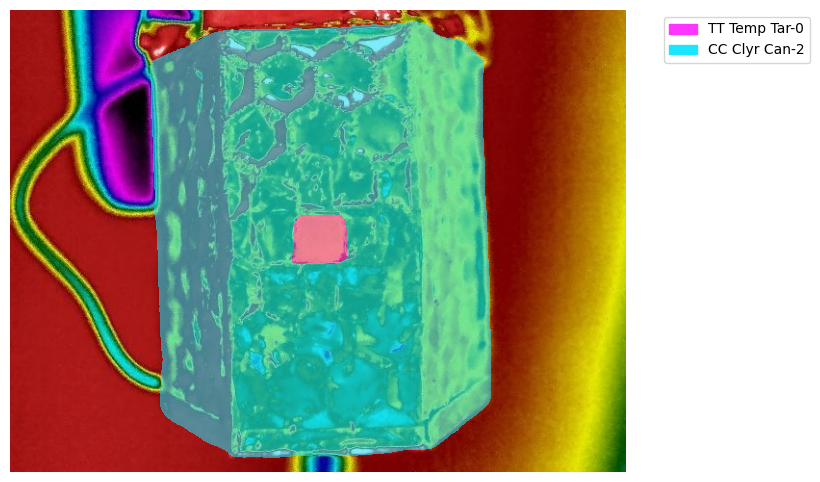

In [8]:
from PIL import Image
import random

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import to_rgb

import numpy as np
import os

id2color = {0: '#000000',
 1: '#1CE6FF',
 2: '#FF34FF',
 3: '#FF4A46',
 4: '#008941',
 5: '#006FA6',
 6: '#A30059',
 7: '#5A0007',
 8: '#809693',
 9: '#FFDBE5',
 10: '#7A4900',
 11: '#0000A6',
 12: '#63FFAC',
 13: '#B79762',
 14: '#004D43',
 15: '#8FB0FF',
 16: '#997D87'}

#go through test folder and show predictions
#test_folder = r'/content/drive/My Drive/Data/Labelbox_Data/Fiesta/test/images'#bbox
#test_folder = r'/content/drive/My Drive/Data/Bellway 44HA image set 20241203/cleaned as report'#bbox
test_folder = r'/content/drive/MyDrive/Training_Data/Jan_2026/Can_and_RAT/images'

random.seed(42)
all_files = os.listdir(test_folder)
#files_to_process = all_files[:5]
#files_to_process = all_files

jpg_files = [f for f in all_files if f.endswith('.jpg')]
files_to_process = random.sample(jpg_files, min(20, len(jpg_files)))

for filename in files_to_process:
  if filename.endswith('.jpg'):
    image = Image.open(os.path.join(test_folder, filename))
  predicted_semantic_map = get_prediction(image)
  num_instances = len(predicted_semantic_map["segments_info"])
  overlay = np.zeros((np.array(image).shape[0], np.array(image).shape[1], 4))


  for i, info in enumerate(predicted_semantic_map["segments_info"]):
        #mask = predicted_semantic_map["segmentation"] == info["id"]
        mask = (predicted_semantic_map["segmentation"] == info["id"]).cpu().numpy()

        label_id = info['label_id']
        hex_color = id2color[label_id]

        color = to_rgb(hex_color)

        if label_id != 0:  #if not background
            overlay[mask, :3] = color[:3]  # RGB channels
            overlay[mask, 3] = 0.8  # Alpha channel for transparency

  fig, ax = plt.subplots(figsize=(8, 6))
  ax.imshow(np.array(image))
  ax.imshow(overlay, interpolation="nearest", alpha=0.7)
  plt.axis("off")

  handles = [
            mpatches.Patch(
                color=id2color[info['label_id']],
                label=f"{model.config.id2label[info['label_id']]}-{i}"
            )
            for i, info in enumerate(predicted_semantic_map["segments_info"])
            if info['label_id'] != 0  # Exclude the background class
        ]
  plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc="upper left")

  plt.show()